In [11]:
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import matplotlib.pyplot as plt
import os
import seaborn as sb
import sys
import warnings
warnings.filterwarnings("ignore", category=UserWarning)
sc.settings.verbosity = 3      
sc.settings.n_jobs=18

In [2]:
sys.path.append('/home/aih/shrey.parikh/cross_species/multiple_system_integration/cross_system_integration/')

In [3]:
sys.path

['/home/aih/shrey.parikh/cross_species',
 '/home/aih/shrey.parikh/miniconda3/envs/cross_species/lib/python311.zip',
 '/home/aih/shrey.parikh/miniconda3/envs/cross_species/lib/python3.11',
 '/home/aih/shrey.parikh/miniconda3/envs/cross_species/lib/python3.11/lib-dynload',
 '',
 '/home/aih/shrey.parikh/miniconda3/envs/cross_species/lib/python3.11/site-packages',
 '/home/aih/shrey.parikh/cross_species/multiple_system_integration/cross_system_integration/']

In [4]:
from cross_system_integration.model._xxjointmodel import XXJointModel

Global seed set to 0


In [5]:
adata = sc.read_h5ad('adata_human_mouse_pig_hvgcomb.h5ad')

In [6]:
#human -0 mouse -1 pig -2

In [7]:
adata.obs['Organism'] = adata.obs.System.map({1:'Mouse', 0:'Human', 2:'Pig'})

In [8]:
adata.obs

,Sample,ID,Batch,annotation_nodoub_2,System,Organism
AAACCCAAGTATAGAC-1,10wpc_1,NaN,JS,Beta,0,Human
AAACGAACATTAGGAA-1,10wpc_1,NaN,JS,Ductal,0,Human
AAACGAATCGAACCTA-1,10wpc_1,NaN,JS,Ductal,0,Human
AAACGAATCGGATACT-1,10wpc_1,NaN,JS,Ductal,0,Human
AAACGCTAGGCAGCTA-1,10wpc_1,NaN,JS,Acinar,0,Human
...,...,...,...,...,...,...
TTTGTCAGTATCACCA-1-1,E85_GFP-_2,ID,Batch,Ductal,2,Pig
TTTGTCATCACGACTA-1,E85_GFP-_2,ID,Batch,Acinar,2,Pig
TTTGTCATCAGTGCAT-1,E85_GFP-_2,ID,Batch,Acinar,2,Pig
TTTGTCATCCACTCCA-1,E85_GFP-_2,ID,Batch,Ductal,2,Pig


In [9]:
adata_training = XXJointModel.setup_anndata(
    adata=adata,
    system_key='Organism',
    group_key=None,
    categorical_covariate_keys=['Batch'],
)

INFO     Using column names from columns of adata.obsm['covariates']                                               
INFO     Using column names from columns of adata.obsm['system']                                                   


In [10]:
adata_training

AnnData object with n_obs × n_vars = 199910 × 383
    obs: 'Sample', 'ID', 'Batch', 'annotation_nodoub_2', 'System', 'Organism'
    var: 'input'
    uns: 'system_order', 'covariate_orders', 'covariates_dict', '_scvi_uuid', '_scvi_manager_uuid'
    obsm: 'system', 'covariates'
    layers: 'counts', 'raw'

In [12]:
model = XXJointModel(
    adata=adata_training,
    prior='vamp',
    n_prior_components=5,
    pseudoinputs_data_init=True,
    trainable_priors=True,
    encode_pseudoinputs_on_eval_mode=True,
    z_dist_metric = 'MSE_standard',
    n_layers=2,
    n_hidden=256)

In [14]:
import pytorch_lightning as pl
model.train(
    max_epochs=80,
    log_every_n_steps=1,
    check_val_every_n_epoch=1,
    val_check_interval=1.0,
    train_size=0.9,
    plan_kwargs={
        'optimizer': "Adam",
        'lr': 0.001,
        'reduce_lr_on_plateau': False,
        'lr_scheduler_metric': 'loss_train',  # Replace with default value
        'lr_patience': 5,  # Replace with default value
        'lr_factor': 0.1,  # Replace with default value
        'lr_min': 1e-7,  # Replace with default value
        'lr_threshold_mode': 'rel',  # Replace with default value
        'lr_threshold': 0.1,  # Replace with default value
        'log_on_epoch': True,  # Replace with default value
        'log_on_step': False,  # Replace with default value
        'loss_weights': {
            'kl_weight': 1.0,  # Replace with default value
            'reconstruction_weight': 1.0,  # Replace with default value
            'z_distance_cycle_weight': 5.0, 
        },
    }
)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-b0a94014-449c-583c-8c16-b9e11db18f44,MIG-b7941885-a733-5316-b58f-ea00b36ec68b]


Epoch 80/80: 100%|█████████████████████████████████████████████████████████████████████████████████████████████████████| 80/80 [33:54<00:00, 25.43s/it, loss=-6.14, v_num=1]


In [159]:
model.trainer.logger.history['loss_validation'].shape[0]/max_epochs

1.0

In [165]:
enumerate(losses)

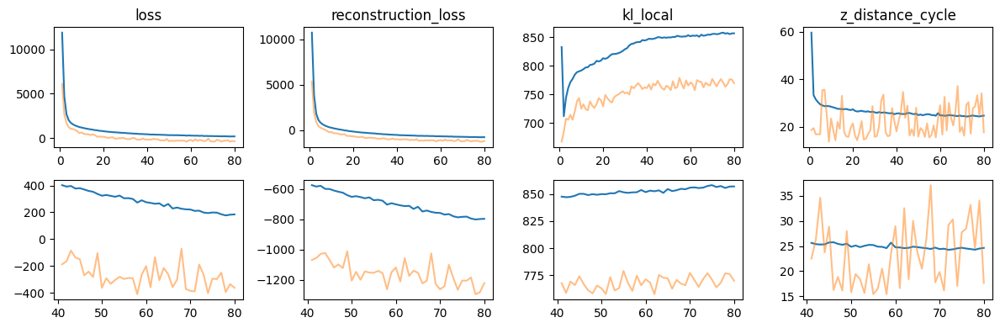

In [166]:
# Plot loses
max_epochs=80
# Make detailed plot after N epochs
epochs_detail_plot=40
steps_detail_plot = epochs_detail_plot*int(
    model.trainer.logger.history['loss_validation'].shape[0]/max_epochs)
detail_plot=epochs_detail_plot

# Loss plotting adapted to the above specified model and its training

# Losses to plot
# Set to plot only loses which we specified to be used for training above
losses=[
     'loss_train',
     'reconstruction_loss_train',
     'kl_local_train',
     'z_distance_cycle_train']
fig,axs=plt.subplots(2,len(losses),figsize=(len(losses)*3,4))
for ax_i,l_train in enumerate(losses):
    l_val=l_train.replace('_train','_validation')
    l_name=l_train.replace('_train','')
    # Change idx of epochs to start with 1 so that below adjustment when 
    # train on step which only works for val leads to appropriate multiplication
    l_val_values=model.trainer.logger.history[l_val].copy()
    l_val_values.index=l_val_values.index+1
    l_train_values=model.trainer.logger.history[l_train].copy()
    l_train_values.index=l_train_values.index+1
    # This happens if log on step as currently this works only for val loss
    if l_train_values.shape[0]<l_val_values.shape[0]:
        l_train_values.index=\
            l_train_values.index*int(l_val_values.shape[0]/l_train_values.shape[0])
    for l_values,c,alpha,dp in [
        # train loss logged on epoch in either case now
        (l_train_values,'tab:blue',1,epochs_detail_plot),
        (l_val_values,'tab:orange',0.5, detail_plot)]:
        axs[0,ax_i].plot( l_values.index,l_values.values.ravel(),c=c,alpha=alpha)
        axs[0,ax_i].set_title(l_name)
        axs[1,ax_i].plot(l_values.index[dp:],
                         l_values.values.ravel()[dp:],c=c,alpha=alpha)

fig.tight_layout()

In [18]:
# Get embedidng - save it into X of new adata
embed= model.embed(adata=adata_training)
embed=sc.AnnData(embed, obs=adata.obs)
# Make system categorical for plotting below
# embed.obs['System']=embed.obs['System'].map({0:'mouse',1:'human',2:'pig'})

In [20]:
embed.obs

,Sample,ID,Batch,annotation_nodoub_2,System,Organism
AAACCCAAGTATAGAC-1,10wpc_1,NaN,JS,Beta,0,Human
AAACGAACATTAGGAA-1,10wpc_1,NaN,JS,Ductal,0,Human
AAACGAATCGAACCTA-1,10wpc_1,NaN,JS,Ductal,0,Human
AAACGAATCGGATACT-1,10wpc_1,NaN,JS,Ductal,0,Human
AAACGCTAGGCAGCTA-1,10wpc_1,NaN,JS,Acinar,0,Human
...,...,...,...,...,...,...
TTTGTCAGTATCACCA-1-1,E85_GFP-_2,ID,Batch,Ductal,2,Pig
TTTGTCATCACGACTA-1,E85_GFP-_2,ID,Batch,Acinar,2,Pig
TTTGTCATCAGTGCAT-1,E85_GFP-_2,ID,Batch,Acinar,2,Pig
TTTGTCATCCACTCCA-1,E85_GFP-_2,ID,Batch,Ductal,2,Pig


In [22]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:00:11)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:55)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:28)


In [23]:
sc.pp.neighbors(embed, use_rep='X')
sc.tl.umap(embed)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:18)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:26)


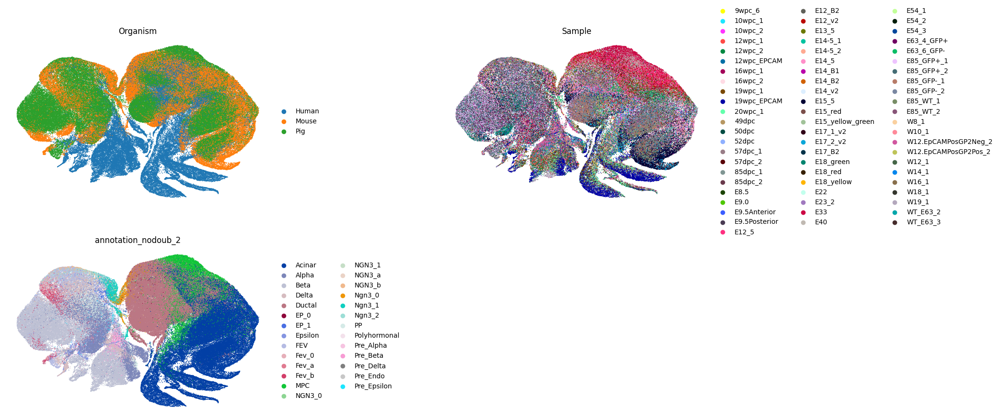

In [146]:
random_indices=np.random.permutation(list(range(embed.shape[0])))
sc.pl.umap(embed[random_indices, :], color=['Organism', 'Sample', 'annotation_nodoub_2'], size=5, wspace=0.5, frameon=False, ncols=2)

In [25]:
embed.obs.groupby('Organism').size()

Organism
Human    55510
Mouse    60079
Pig      84321
dtype: int64

In [45]:
embed.write('embed_three.h5ad')

In [47]:
model.save('model_three')

In [30]:
embed.obs.Sample.unique()

['10wpc_1', '10wpc_2', '12wpc_1', '12wpc_2', '12wpc_EPCAM', ..., 'E85_WT_1', 'E85_WT_2', 'E85_GFP+_1', 'E85_GFP-_1', 'E85_GFP-_2']
Length: 67
Categories (67, object): ['9wpc_6', '10wpc_1', '10wpc_2', '12wpc_1', ..., 'W18_1', 'W19_1', 'WT_E63_2', 'WT_E63_3']

In [79]:
def process_sample_values(ele):
    if 'wpc' in ele:
        digits = ''.join([char for char in ele.split('_')[0] if char.isdigit()][:2])
        return int(digits) * 7
    elif ele.startswith('E'):
        if '.' in ele:
            return '.'.join([char for char in ele.split('_')[0] if char.isdigit()][:2])
        else: 
            return ''.join([char for char in ele.split('_')[0] if char.isdigit()][:2])
    elif ele.startswith('WT'):
        return ''.join([char for char in ele.split('_')[1] if char.isdigit()][:2])
    elif ele.startswith('W'):
        digits = ''.join([char for char in ele.split('_')[0] if char.isdigit()][:2])
        return int(digits) * 7
    elif 'dpc' in ele:
        return ''.join([char for char in ele.split('_')[0] if char.isdigit()][:2])
    else:
        return None

In [80]:
embed.obs['Age'] = embed.obs.Sample.apply(process_sample_values)

In [85]:
embed.obs.Age =  embed.obs.Age.astype(float)

In [86]:
embed.obs['Mouse_Age'] = np.where(embed.obs.Organism == 'Mouse', embed.obs.Age, np.nan)
embed.obs['Human_Age'] = np.where(embed.obs.Organism == 'Human', embed.obs.Age, np.nan)
embed.obs['Pig_Age'] = np.where(embed.obs.Organism == 'Mouse', embed.obs.Age, np.nan)


In [87]:
random_indices=np.random.permutation(list(range(embed.shape[0])))

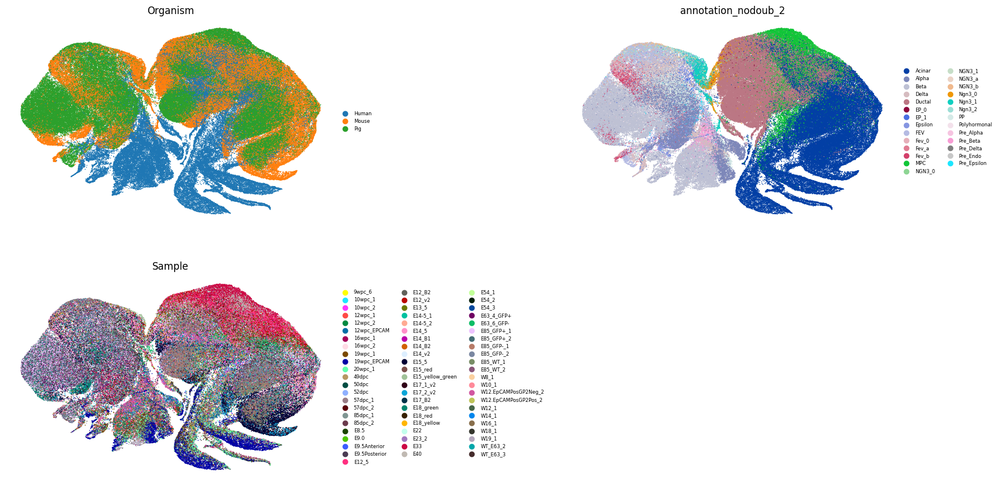

In [173]:
random_indices=np.random.permutation(list(range(adata.shape[0])))
sc.pl.umap(adata[random_indices,:], color=['Organism', 'annotation_nodoub_2', 'Sample'], size=5, wspace=0.55, legend_fontsize=6, ncols=2, frameon=False)

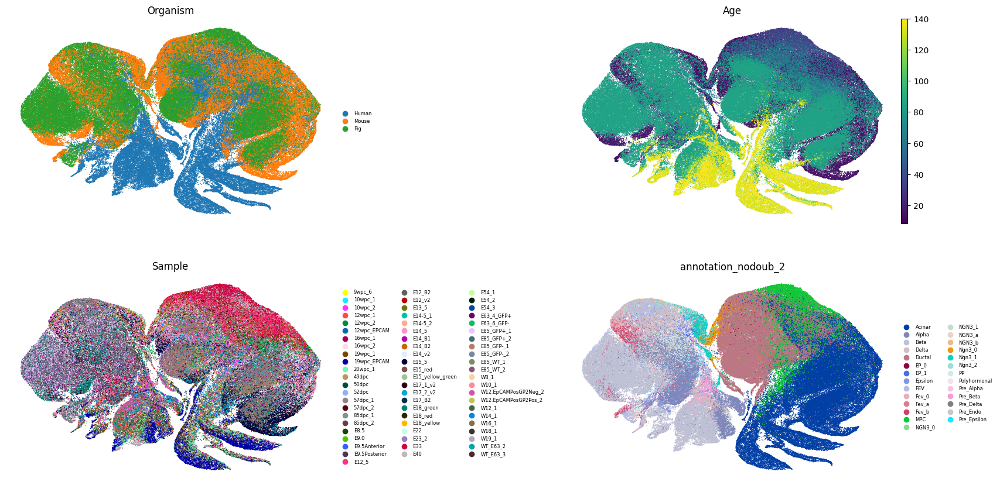

In [148]:
random_indices=np.random.permutation(list(range(embed.shape[0])))
sc.pl.umap(embed[random_indices,:], color=['Organism', 'Age','Sample', 'annotation_nodoub_2'], size=5, ncols=2, wspace=0.55, legend_fontsize=6, frameon=False)
# sc.pl.umap(embed[random_indices,:], color=[], size=5, legend_fontsize=6, wspace=.55)

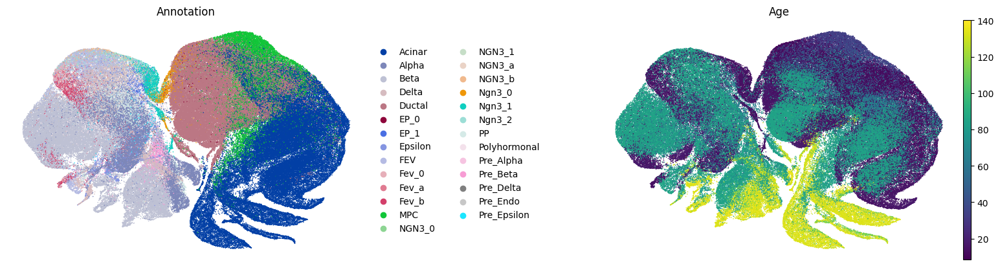

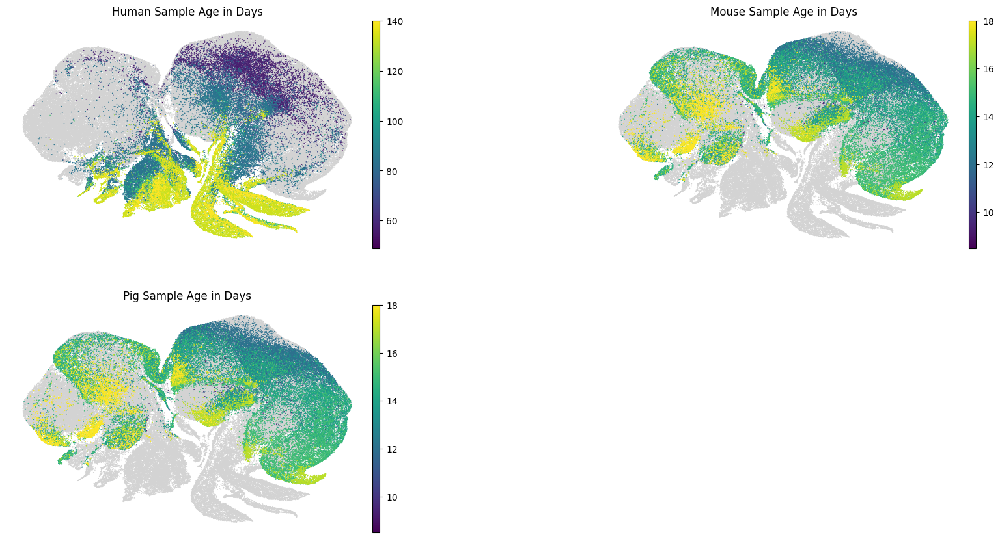

In [154]:
sc.pl.umap(embed[random_indices,:], color=['annotation_nodoub_2','Age'], size=5, wspace=0.5, sort_order=False, ncols=2, title=['Annotation', 'Age', ], frameon=False)
sc.pl.umap(embed, color=['Human_Age', 'Mouse_Age', 'Pig_Age'], size=5, wspace=0.5, ncols=2, title=['Human Sample Age in Days', 'Mouse Sample Age in Days', 'Pig Sample Age in Days'], frameon=False)


In [127]:
adata.obsm['X_raw'] = adata.obsm['X_umap']

In [128]:
adata.obsm['X_embed'] = embed.obsm['X_umap']

In [130]:
adata

AnnData object with n_obs × n_vars = 199910 × 383
    obs: 'Sample', 'ID', 'Batch', 'annotation_nodoub_2', 'System', 'Organism'
    var: 'input'
    uns: 'system_order', 'covariate_orders', 'covariates_dict', '_scvi_uuid', '_scvi_manager_uuid', 'neighbors', 'umap'
    obsm: 'system', 'covariates', 'X_pca', 'X_umap', 'X_raw', 'X_embed'
    layers: 'counts', 'raw'
    obsp: 'distances', 'connectivities'

In [131]:
adata.obsm['X_umap'] = adata.obsm['X_embed']

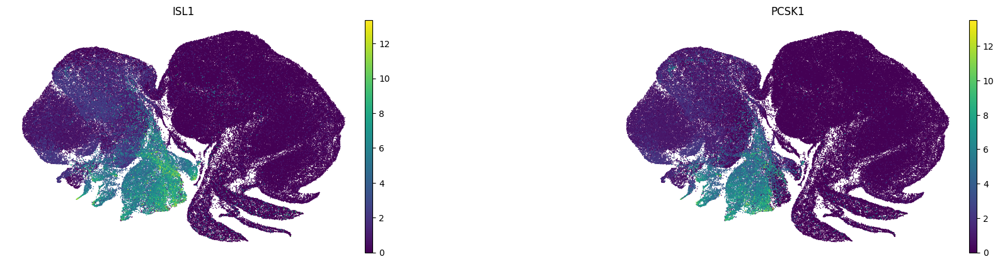

In [150]:
sc.pl.umap(adata[random_indices,:], color=['ISL1', 'PCSK1'], size=5, ncols=2, wspace=0.55, legend_fontsize=6, frameon=False)


In [124]:
adata[:, adata.var.index.isin(['NEUROG3', 'NKX6-1', 'ISL1', 'PCSK1'])].var

,input
ISL1,1
PCSK1,1


In [121]:
embed

AnnData object with n_obs × n_vars = 199910 × 15
    obs: 'Sample', 'ID', 'Batch', 'annotation_nodoub_2', 'System', 'Organism', 'Age', 'Mouse_Age', 'Human_Age', 'Pig_Age'
    uns: 'neighbors', 'umap', 'Organism_colors', 'Batch_colors', 'annotation_nodoub_2_colors', 'Sample_colors'
    obsm: 'X_umap'
    obsp: 'distances', 'connectivities'

## Increase the number of epochs

In [167]:
model_200 = XXJointModel(
    adata=adata_training,
    prior='vamp',
    n_prior_components=5,
    pseudoinputs_data_init=True,
    trainable_priors=True,
    encode_pseudoinputs_on_eval_mode=True,
    z_dist_metric = 'MSE_standard',
    n_layers=2,
    n_hidden=256)

In [170]:
import pytorch_lightning as pl
model_200.train(
    max_epochs=200,
    log_every_n_steps=1,
    check_val_every_n_epoch=1,
    val_check_interval=1.0,
    train_size=0.9,
    plan_kwargs={
        'optimizer': "Adam",
        'lr': 0.001,
        'reduce_lr_on_plateau': False,
        'lr_scheduler_metric': 'loss_train',  # Replace with default value
        'lr_patience': 5,  # Replace with default value
        'lr_factor': 0.1,  # Replace with default value
        'lr_min': 1e-7,  # Replace with default value
        'lr_threshold_mode': 'rel',  # Replace with default value
        'lr_threshold': 0.1,  # Replace with default value
        'log_on_epoch': True,  # Replace with default value
        'log_on_step': False,  # Replace with default value
        'loss_weights': {
            'kl_weight': 1.0,  # Replace with default value
            'reconstruction_weight': 1.0,  # Replace with default value
            'z_distance_cycle_weight': 5.0, 
        },
    }
)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs
`Trainer(val_check_interval=1.0)` was configured so validation will run at the end of the training epoch..
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [MIG-b0a94014-449c-583c-8c16-b9e11db18f44,MIG-b7941885-a733-5316-b58f-ea00b36ec68b]


Epoch 200/200: 100%|███████████████████████████████████████████████████████████| 200/200 [1:29:37<00:00, 26.89s/it, loss=0.76, v_num=1]


In [171]:
model_200

Overwrite this attribute to get an informative representation for your model
Training status: Trained

In [172]:
model_200.save('model_three_200')

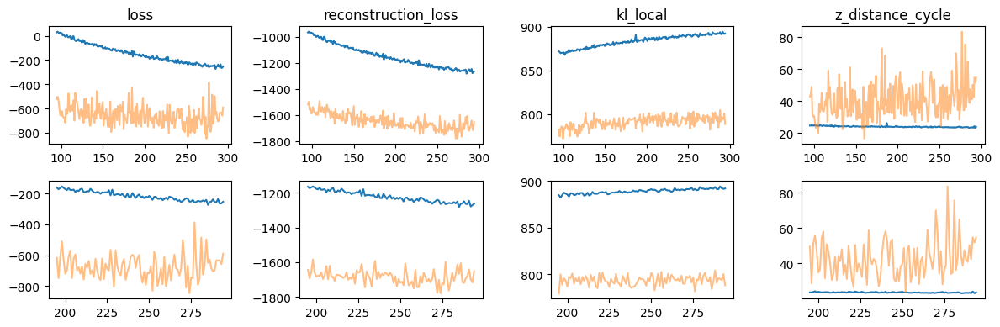

In [175]:
# Plot loses
max_epochs=200
# Make detailed plot after N epochs
epochs_detail_plot=100
steps_detail_plot = epochs_detail_plot*int(
    model_200.trainer.logger.history['loss_validation'].shape[0]/max_epochs)
detail_plot=epochs_detail_plot

# Loss plotting adapted to the above specified model and its training

# Losses to plot
# Set to plot only loses which we specified to be used for training above
losses=[
     'loss_train',
     'reconstruction_loss_train',
     'kl_local_train',
     'z_distance_cycle_train']
fig,axs=plt.subplots(2,len(losses),figsize=(len(losses)*3,4))
for ax_i,l_train in enumerate(losses):
    l_val=l_train.replace('_train','_validation')
    l_name=l_train.replace('_train','')
    # Change idx of epochs to start with 1 so that below adjustment when 
    # train on step which only works for val leads to appropriate multiplication
    l_val_values=model_200.trainer.logger.history[l_val].copy()
    l_val_values.index=l_val_values.index+1
    l_train_values=model_200.trainer.logger.history[l_train].copy()
    l_train_values.index=l_train_values.index+1
    # This happens if log on step as currently this works only for val loss
    if l_train_values.shape[0]<l_val_values.shape[0]:
        l_train_values.index=\
            l_train_values.index*int(l_val_values.shape[0]/l_train_values.shape[0])
    for l_values,c,alpha,dp in [
        # train loss logged on epoch in either case now
        (l_train_values,'tab:blue',1,epochs_detail_plot),
        (l_val_values,'tab:orange',0.5, detail_plot)]:
        axs[0,ax_i].plot( l_values.index,l_values.values.ravel(),c=c,alpha=alpha)
        axs[0,ax_i].set_title(l_name)
        axs[1,ax_i].plot(l_values.index[dp:],
                         l_values.values.ravel()[dp:],c=c,alpha=alpha)

fig.tight_layout()

In [177]:
# Get embedidng - save it into X of new adata
embed_200= model_200.embed(adata=adata_training)
embed_200=sc.AnnData(embed_200, obs=adata.obs)
# Make system categorical for plotting below
# embed.obs['System']=embed.obs['System'].map({0:'mouse',1:'human',2:'pig'})

In [178]:
sc.pp.neighbors(embed_200, use_rep='X')
sc.tl.umap(embed_200)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:02:39)


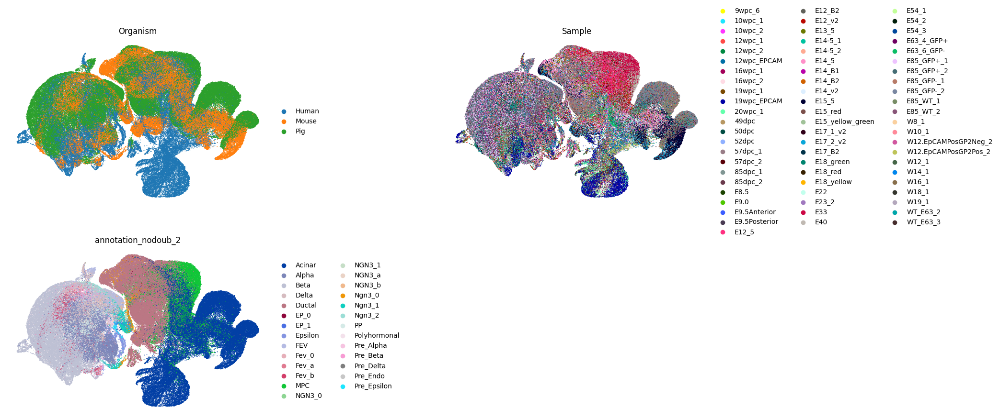

In [179]:
random_indices=np.random.permutation(list(range(embed_200.shape[0])))
sc.pl.umap(embed_200[random_indices, :], color=['Organism', 'Sample', 'annotation_nodoub_2'], size=5, wspace=0.5, frameon=False, ncols=2)

In [180]:
embed_200.obs['Age'] = embed_200.obs.Sample.apply(process_sample_values)
embed_200.obs.Age =  embed_200.obs.Age.astype(float)
embed_200.obs['Mouse_Age'] = np.where(embed_200.obs.Organism == 'Mouse', embed_200.obs.Age, np.nan)
embed_200.obs['Human_Age'] = np.where(embed_200.obs.Organism == 'Human', embed_200.obs.Age, np.nan)
embed_200.obs['Pig_Age'] = np.where(embed_200.obs.Organism == 'Mouse', embed_200.obs.Age, np.nan)


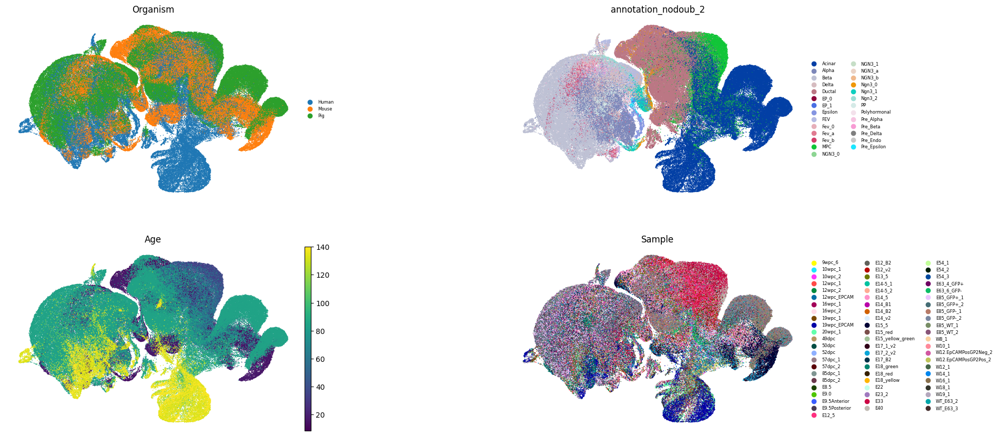

In [181]:
random_indices=np.random.permutation(list(range(embed_200.shape[0])))
sc.pl.umap(embed_200[random_indices,:], color=['Organism', 'annotation_nodoub_2', 'Age','Sample'], size=5, ncols=2, wspace=0.55, legend_fontsize=6, frameon=False)
# sc.pl.umap(embed_200[random_indices,:], color=[], size=5, legend_fontsize=6, wspace=.55)

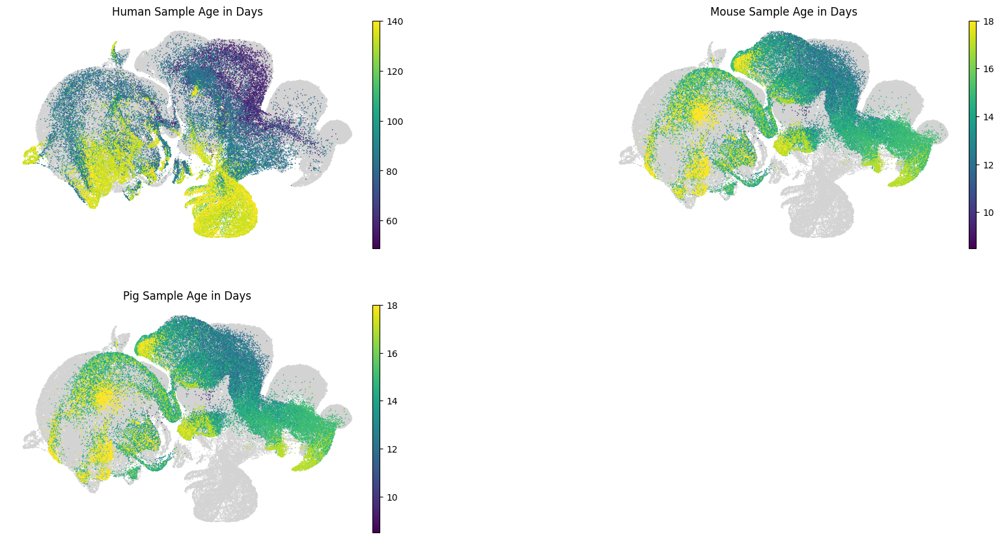

In [182]:
sc.pl.umap(embed_200, color=['Human_Age', 'Mouse_Age', 'Pig_Age'], size=5, wspace=0.5, ncols=2, title=['Human Sample Age in Days', 'Mouse Sample Age in Days', 'Pig Sample Age in Days'], frameon=False)


In [183]:
adata.obsm['X_embed_200'] = embed_200.obsm['X_umap']

In [184]:
adata.obsm['X_umap'] = adata.obsm['X_embed_200']

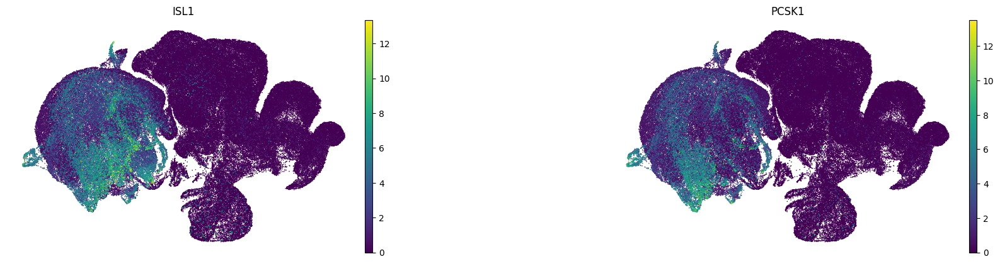

In [185]:
sc.pl.umap(adata[random_indices,:], color=['ISL1', 'PCSK1'], size=5, ncols=2, wspace=0.55, legend_fontsize=6, frameon=False)


In [186]:
embed_200.write('embed_three_200.h5ad')